In [1]:
#import necessary library
import pandas as pd, numpy as np, hashlib, string, matplotlib.pyplot as plt
from IPython.display import HTML
import base64

In [2]:
#import the dataset to work with
url = "https://raw.githubusercontent.com/the-buike/hospital-flow-insights/refs/heads/main/original%20dataset/healthcare_dataset.csv"
hospital = pd.read_csv(url, low_memory=False)

In [3]:
#Quick peek of the data set
hospital.shape



(55500, 15)

In [4]:
hospital.head(10)    


,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,205,Emergency,2022-10-07,Aspirin,Normal
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,2020-12-18,Ibuprofen,Abnormal
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,458,Urgent,2022-10-09,Penicillin,Abnormal
5,EMILY JOHNSOn,36,Male,A+,Asthma,2023-12-20,Taylor Newton,Nunez-Humphrey,UnitedHealthcare,48145.110951,389,Urgent,2023-12-24,Ibuprofen,Normal
6,edwArD EDWaRDs,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Group Middleton,Medicare,19580.872345,389,Emergency,2020-11-15,Paracetamol,Inconclusive
7,CHrisTInA MARtinez,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,"Powell Robinson and Valdez,",Cigna,45820.462722,277,Emergency,2022-01-07,Paracetamol,Inconclusive
8,JASmINe aGuIlaR,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Sons Rich and,Cigna,50119.222792,316,Elective,2020-07-14,Aspirin,Abnormal
9,ChRISTopher BerG,58,Female,AB-,Cancer,2021-05-23,Heather Day,Padilla-Walker,UnitedHealthcare,19784.631062,249,Elective,2021-06-22,Paracetamol,Inconclusive


In [5]:
hospital.sample(5, random_state=1) 

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
32354,MichAel MILLs,63,Male,O-,Cancer,2023-06-30,Ronald Gordon,Weber-Mcpherson,Medicare,47417.999804,387,Elective,2023-07-06,Paracetamol,Inconclusive
46537,wiLlIam RAmirEz,81,Female,B-,Asthma,2022-09-17,Christian Galvan,Murphy-French,Aetna,10003.054673,249,Emergency,2022-10-14,Ibuprofen,Normal
34234,JosEph MeYER,51,Male,AB-,Arthritis,2024-01-07,Daniel Fuller,Cannon-Dorsey,Cigna,37291.170540,149,Emergency,2024-01-27,Aspirin,Inconclusive
54136,DR. micHaEl MckAy,64,Male,O+,Cancer,2019-05-31,Dawn Navarro,"Mcconnell and Rios, Clark",UnitedHealthcare,-199.663795,122,Urgent,2019-06-12,Ibuprofen,Abnormal
16406,MoNiCA CaRpEnTER,72,Male,O+,Diabetes,2021-12-12,Douglas Walters,Sons and Lloyd,Aetna,41148.678103,470,Elective,2022-01-05,Paracetamol,Inconclusive


In [6]:
hospital.columns.tolist()

['Name',
 'Age',
 'Gender',
 'Blood Type',
 'Medical Condition',
 'Date of Admission',
 'Doctor',
 'Hospital',
 'Insurance Provider',
 'Billing Amount',
 'Room Number',
 'Admission Type',
 'Discharge Date',
 'Medication',
 'Test Results']

In [7]:
hospital.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55500 entries, 0 to 55499
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Name                55500 non-null  object 
 1   Age                 55500 non-null  int64  
 2   Gender              55500 non-null  object 
 3   Blood Type          55500 non-null  object 
 4   Medical Condition   55500 non-null  object 
 5   Date of Admission   55500 non-null  object 
 6   Doctor              55500 non-null  object 
 7   Hospital            55500 non-null  object 
 8   Insurance Provider  55500 non-null  object 
 9   Billing Amount      55500 non-null  float64
 10  Room Number         55500 non-null  int64  
 11  Admission Type      55500 non-null  object 
 12  Discharge Date      55500 non-null  object 
 13  Medication          55500 non-null  object 
 14  Test Results        55500 non-null  object 
dtypes: float64(1), int64(2), object(12)
memory usage: 6.4

my observations:

1. patient name  columns are not standardized 

2. some columns like date have the wrong data types

3. billing amount has negatives

4. index starts with 0 instead of 1

5. billing amount is in 4 to 6 decimal places but i want it in 2 decimals

6. Columns not standardized 

In [8]:
#Standardize columns
hospital.columns = (hospital.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('r,[^a-z0-9_]', '', regex=True))

In [9]:
#rename name to patient_name
hospital.rename(columns={'name': 'patient_name'}, inplace=True)

In [10]:
#rename doctor to doctor_name
hospital.rename(columns={'doctor': 'doctor_name'}, inplace=True)

In [11]:
#Standardize patients names
hospital['patient_name'] = (hospital['patient_name'].str.strip().str.title())

In [12]:
hospital.head(10)   

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results
0,Bobby Jackson,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal
1,Leslie Terry,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
2,Danny Smith,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,205,Emergency,2022-10-07,Aspirin,Normal
3,Andrew Watts,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,2020-12-18,Ibuprofen,Abnormal
4,Adrienne Bell,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,458,Urgent,2022-10-09,Penicillin,Abnormal
5,Emily Johnson,36,Male,A+,Asthma,2023-12-20,Taylor Newton,Nunez-Humphrey,UnitedHealthcare,48145.110951,389,Urgent,2023-12-24,Ibuprofen,Normal
6,Edward Edwards,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Group Middleton,Medicare,19580.872345,389,Emergency,2020-11-15,Paracetamol,Inconclusive
7,Christina Martinez,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,"Powell Robinson and Valdez,",Cigna,45820.462722,277,Emergency,2022-01-07,Paracetamol,Inconclusive
8,Jasmine Aguilar,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Sons Rich and,Cigna,50119.222792,316,Elective,2020-07-14,Aspirin,Abnormal
9,Christopher Berg,58,Female,AB-,Cancer,2021-05-23,Heather Day,Padilla-Walker,UnitedHealthcare,19784.631062,249,Elective,2021-06-22,Paracetamol,Inconclusive


In [13]:
#change the date to date type
hospital['date_of_admission'] = pd.to_datetime(hospital['date_of_admission'], errors='coerce')
hospital['discharge_date'] = pd.to_datetime(hospital['discharge_date'], errors='coerce')

In [14]:
#standardize billing_amount to check for negative amounts
hospital[hospital['billing_amount'] < 0]

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results
132,Ashley Erickson,32,Female,AB-,Cancer,2019-11-05,Gerald Hooper,"and Johnson Moore, Branch",Aetna,-502.507813,376,Urgent,2019-11-23,Penicillin,Normal
799,Christopher Weiss,49,Female,AB-,Asthma,2023-02-16,Kelly Thompson,Hunter-Hughes,Aetna,-1018.245371,204,Elective,2023-03-09,Penicillin,Inconclusive
1018,Ashley Warner,60,Male,A+,Hypertension,2021-12-21,Andrea Bentley,"and Wagner, Lee Klein",Aetna,-306.364925,426,Elective,2022-01-11,Ibuprofen,Normal
1421,Jay Galloway,74,Female,O+,Asthma,2021-01-20,Debra Everett,Group Peters,Blue Cross,-109.097122,381,Emergency,2021-02-09,Ibuprofen,Abnormal
2103,Joshua Williamson,72,Female,B-,Diabetes,2021-03-21,Wendy Ramos,"and Huff Reeves, Dennis",Blue Cross,-576.727907,369,Urgent,2021-04-17,Aspirin,Abnormal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52894,Joseph Cox,23,Male,AB-,Diabetes,2019-10-13,Peter Smith,Inc Ward,Blue Cross,-353.865186,271,Elective,2019-10-25,Lipitor,Inconclusive
53204,Ashley Warner,55,Male,A+,Hypertension,2021-12-21,Andrea Bentley,"and Wagner, Lee Klein",Aetna,-306.364925,426,Elective,2022-01-11,Ibuprofen,Normal
53232,Daniel Drake,68,Female,B+,Hypertension,2020-04-24,Brett Ray,Carr Ltd,Aetna,-591.917419,426,Elective,2020-04-26,Lipitor,Abnormal
54136,Dr. Michael Mckay,64,Male,O+,Cancer,2019-05-31,Dawn Navarro,"Mcconnell and Rios, Clark",UnitedHealthcare,-199.663795,122,Urgent,2019-06-12,Ibuprofen,Abnormal


In [15]:
hospital['billing_amount'] = hospital['billing_amount'].abs()

In [16]:
#Round the billing_amount to 2 decimal places
hospital['billing_amount'] = hospital['billing_amount'].round(2)

In [17]:
hospital.head(10)

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results
0,Bobby Jackson,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.28,328,Urgent,2024-02-02,Paracetamol,Normal
1,Leslie Terry,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.33,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
2,Danny Smith,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.10,205,Emergency,2022-10-07,Aspirin,Normal
3,Andrew Watts,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78,450,Elective,2020-12-18,Ibuprofen,Abnormal
4,Adrienne Bell,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.32,458,Urgent,2022-10-09,Penicillin,Abnormal
5,Emily Johnson,36,Male,A+,Asthma,2023-12-20,Taylor Newton,Nunez-Humphrey,UnitedHealthcare,48145.11,389,Urgent,2023-12-24,Ibuprofen,Normal
6,Edward Edwards,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Group Middleton,Medicare,19580.87,389,Emergency,2020-11-15,Paracetamol,Inconclusive
7,Christina Martinez,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,"Powell Robinson and Valdez,",Cigna,45820.46,277,Emergency,2022-01-07,Paracetamol,Inconclusive
8,Jasmine Aguilar,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Sons Rich and,Cigna,50119.22,316,Elective,2020-07-14,Aspirin,Abnormal
9,Christopher Berg,58,Female,AB-,Cancer,2021-05-23,Heather Day,Padilla-Walker,UnitedHealthcare,19784.63,249,Elective,2021-06-22,Paracetamol,Inconclusive


In [18]:
#standardize the index to start from 1
hospital.index = range(1, len(hospital) + 1)

In [19]:
hospital.head(10)

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results
1,Bobby Jackson,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.28,328,Urgent,2024-02-02,Paracetamol,Normal
2,Leslie Terry,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.33,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
3,Danny Smith,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.10,205,Emergency,2022-10-07,Aspirin,Normal
4,Andrew Watts,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78,450,Elective,2020-12-18,Ibuprofen,Abnormal
5,Adrienne Bell,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.32,458,Urgent,2022-10-09,Penicillin,Abnormal
6,Emily Johnson,36,Male,A+,Asthma,2023-12-20,Taylor Newton,Nunez-Humphrey,UnitedHealthcare,48145.11,389,Urgent,2023-12-24,Ibuprofen,Normal
7,Edward Edwards,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Group Middleton,Medicare,19580.87,389,Emergency,2020-11-15,Paracetamol,Inconclusive
8,Christina Martinez,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,"Powell Robinson and Valdez,",Cigna,45820.46,277,Emergency,2022-01-07,Paracetamol,Inconclusive
9,Jasmine Aguilar,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Sons Rich and,Cigna,50119.22,316,Elective,2020-07-14,Aspirin,Abnormal
10,Christopher Berg,58,Female,AB-,Cancer,2021-05-23,Heather Day,Padilla-Walker,UnitedHealthcare,19784.63,249,Elective,2021-06-22,Paracetamol,Inconclusive


#Observation

1. we need unique ids for doctor, patient, and admission since we dont have them 

in other to check duplicates and what not.

In [20]:
#create patient_id
hospital['patient_id'] = (pd.factorize(hospital['patient_name'] + hospital['gender'] + hospital['blood_type'])[0] + 1)

In [21]:
hospital.head(10)

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id
1,Bobby Jackson,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.28,328,Urgent,2024-02-02,Paracetamol,Normal,1
2,Leslie Terry,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.33,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,2
3,Danny Smith,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.10,205,Emergency,2022-10-07,Aspirin,Normal,3
4,Andrew Watts,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78,450,Elective,2020-12-18,Ibuprofen,Abnormal,4
5,Adrienne Bell,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.32,458,Urgent,2022-10-09,Penicillin,Abnormal,5
6,Emily Johnson,36,Male,A+,Asthma,2023-12-20,Taylor Newton,Nunez-Humphrey,UnitedHealthcare,48145.11,389,Urgent,2023-12-24,Ibuprofen,Normal,6
7,Edward Edwards,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Group Middleton,Medicare,19580.87,389,Emergency,2020-11-15,Paracetamol,Inconclusive,7
8,Christina Martinez,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,"Powell Robinson and Valdez,",Cigna,45820.46,277,Emergency,2022-01-07,Paracetamol,Inconclusive,8
9,Jasmine Aguilar,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Sons Rich and,Cigna,50119.22,316,Elective,2020-07-14,Aspirin,Abnormal,9
10,Christopher Berg,58,Female,AB-,Cancer,2021-05-23,Heather Day,Padilla-Walker,UnitedHealthcare,19784.63,249,Elective,2021-06-22,Paracetamol,Inconclusive,10


In [22]:
#add p - for patients and pad with leading zeros to make all ids haave the same length
hospital['patient_id'] = 'P' + hospital['patient_id'].astype(str).str.zfill(5)

In [23]:
hospital.head(10)

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id
1,Bobby Jackson,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.28,328,Urgent,2024-02-02,Paracetamol,Normal,P00001
2,Leslie Terry,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.33,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,P00002
3,Danny Smith,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.10,205,Emergency,2022-10-07,Aspirin,Normal,P00003
4,Andrew Watts,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78,450,Elective,2020-12-18,Ibuprofen,Abnormal,P00004
5,Adrienne Bell,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.32,458,Urgent,2022-10-09,Penicillin,Abnormal,P00005
6,Emily Johnson,36,Male,A+,Asthma,2023-12-20,Taylor Newton,Nunez-Humphrey,UnitedHealthcare,48145.11,389,Urgent,2023-12-24,Ibuprofen,Normal,P00006
7,Edward Edwards,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Group Middleton,Medicare,19580.87,389,Emergency,2020-11-15,Paracetamol,Inconclusive,P00007
8,Christina Martinez,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,"Powell Robinson and Valdez,",Cigna,45820.46,277,Emergency,2022-01-07,Paracetamol,Inconclusive,P00008
9,Jasmine Aguilar,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Sons Rich and,Cigna,50119.22,316,Elective,2020-07-14,Aspirin,Abnormal,P00009
10,Christopher Berg,58,Female,AB-,Cancer,2021-05-23,Heather Day,Padilla-Walker,UnitedHealthcare,19784.63,249,Elective,2021-06-22,Paracetamol,Inconclusive,P00010


In [24]:
#create doctor_id
hospital['doctor_id'] = (pd.factorize(hospital['doctor_name'])[0] + 1)

In [25]:
#add d - for doctor and pad with leading zeros to make all ids haave the same length
hospital['doctor_id'] = 'D' + hospital['doctor_id'].astype(str).str.zfill(4)

In [26]:
hospital.head(10)

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id
1,Bobby Jackson,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.28,328,Urgent,2024-02-02,Paracetamol,Normal,P00001,D0001
2,Leslie Terry,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.33,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,P00002,D0002
3,Danny Smith,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.10,205,Emergency,2022-10-07,Aspirin,Normal,P00003,D0003
4,Andrew Watts,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78,450,Elective,2020-12-18,Ibuprofen,Abnormal,P00004,D0004
5,Adrienne Bell,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.32,458,Urgent,2022-10-09,Penicillin,Abnormal,P00005,D0005
6,Emily Johnson,36,Male,A+,Asthma,2023-12-20,Taylor Newton,Nunez-Humphrey,UnitedHealthcare,48145.11,389,Urgent,2023-12-24,Ibuprofen,Normal,P00006,D0006
7,Edward Edwards,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Group Middleton,Medicare,19580.87,389,Emergency,2020-11-15,Paracetamol,Inconclusive,P00007,D0007
8,Christina Martinez,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,"Powell Robinson and Valdez,",Cigna,45820.46,277,Emergency,2022-01-07,Paracetamol,Inconclusive,P00008,D0008
9,Jasmine Aguilar,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Sons Rich and,Cigna,50119.22,316,Elective,2020-07-14,Aspirin,Abnormal,P00009,D0009
10,Christopher Berg,58,Female,AB-,Cancer,2021-05-23,Heather Day,Padilla-Walker,UnitedHealthcare,19784.63,249,Elective,2021-06-22,Paracetamol,Inconclusive,P00010,D0010


In [27]:
#create admission_id
hospital['admission_id'] = 'A' + hospital.index.astype(str).str.zfill(6)

In [28]:
hospital.head(10)

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id,admission_id
1,Bobby Jackson,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.28,328,Urgent,2024-02-02,Paracetamol,Normal,P00001,D0001,A000001
2,Leslie Terry,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.33,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,P00002,D0002,A000002
3,Danny Smith,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.10,205,Emergency,2022-10-07,Aspirin,Normal,P00003,D0003,A000003
4,Andrew Watts,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78,450,Elective,2020-12-18,Ibuprofen,Abnormal,P00004,D0004,A000004
5,Adrienne Bell,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.32,458,Urgent,2022-10-09,Penicillin,Abnormal,P00005,D0005,A000005
6,Emily Johnson,36,Male,A+,Asthma,2023-12-20,Taylor Newton,Nunez-Humphrey,UnitedHealthcare,48145.11,389,Urgent,2023-12-24,Ibuprofen,Normal,P00006,D0006,A000006
7,Edward Edwards,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Group Middleton,Medicare,19580.87,389,Emergency,2020-11-15,Paracetamol,Inconclusive,P00007,D0007,A000007
8,Christina Martinez,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,"Powell Robinson and Valdez,",Cigna,45820.46,277,Emergency,2022-01-07,Paracetamol,Inconclusive,P00008,D0008,A000008
9,Jasmine Aguilar,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Sons Rich and,Cigna,50119.22,316,Elective,2020-07-14,Aspirin,Abnormal,P00009,D0009,A000009
10,Christopher Berg,58,Female,AB-,Cancer,2021-05-23,Heather Day,Padilla-Walker,UnitedHealthcare,19784.63,249,Elective,2021-06-22,Paracetamol,Inconclusive,P00010,D0010,A000010


Next we start checking for duplicates and nulls, having created the IDs that will help 

In [29]:
#check for total row
len(hospital)

55500

In [30]:
#run null count by columns
hospital.isnull().sum().sort_values(ascending=False)

patient_name          0
age                   0
gender                0
blood_type            0
medical_condition     0
date_of_admission     0
doctor_name           0
hospital              0
insurance_provider    0
billing_amount        0
room_number           0
admission_type        0
discharge_date        0
medication            0
test_results          0
patient_id            0
doctor_id             0
admission_id          0
dtype: int64

No null values found.

But that does not really mean every column has no nulls, sometimes trailing spaces can be mistake for actual data but in reality it is empty so we will have to check for those too.

In [31]:
#search for trailing spaces in text and object columns
for col in hospital.select_dtypes(include='object').columns:
    blanks = hospital[col].apply(lambda x: str(x).strip() == '').sum()
    if blanks > 0:
        print(f"{col}: {blanks} blank entries")
    else:
        print(f"There are {blanks} blanks")

There are 0 blanks
There are 0 blanks
There are 0 blanks
There are 0 blanks
There are 0 blanks
There are 0 blanks
There are 0 blanks
There are 0 blanks
There are 0 blanks
There are 0 blanks
There are 0 blanks
There are 0 blanks
There are 0 blanks


The outcome shows there are no hidden blanks too. Now we move to checking for duplicates


In [32]:
#Find exact duplicates first (that is same everything)
hospital.duplicated(keep='first').sum()

np.int64(0)

No exact duplicates with the same everything, now we move to checking duplicates where something is different like probably age or date of admission

In [33]:
#check for same patient and same admission
dup1 = hospital.groupby(['patient_id', 'blood_type', 'gender', 'date_of_admission', 'discharge_date']).size().reset_index(name='n')
dup1[dup1['n'] > 1].head(200)

,patient_id,blood_type,gender,date_of_admission,discharge_date,n
4,P00005,AB+,Female,2022-09-19,2022-10-09,2
44,P00045,AB-,Female,2020-08-23,2020-09-08,2
65,P00065,A-,Male,2020-05-08,2020-06-01,2
77,P00075,AB-,Female,2023-07-24,2023-08-11,2
82,P00080,B+,Male,2024-03-02,2024-03-26,2
...,...,...,...,...,...,...
1815,P01738,A+,Female,2019-07-13,2019-07-19,2
1820,P01743,A+,Female,2021-05-20,2021-06-08,2
1830,P01751,O+,Female,2022-07-13,2022-07-21,2
1845,P01766,B-,Female,2020-08-08,2020-09-04,2


From the output, it looks like some patients were double booked for appointments on the system.
we will have to confirm futher 

In [34]:
#confirm each one to see 
hospital[
    (hospital['patient_id'] == 'P00045') &
    (hospital['date_of_admission'] == '2020-08-23')
]

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id,admission_id
45,Paul Williams,81,Female,AB-,Cancer,2020-08-23,Kristin Martinez,"Gates Brown, and Stuart",Medicare,42684.56,328,Urgent,2020-09-08,Penicillin,Abnormal,P00045,D0045,A000045
53326,Paul Williams,85,Female,AB-,Cancer,2020-08-23,Kristin Martinez,"Gates Brown, and Stuart",Medicare,42684.56,328,Urgent,2020-09-08,Penicillin,Abnormal,P00045,D0045,A053326


The idea is to check all duplicated paitients appointments by grouping by blood type, patientid, gender, date of admission and date of discharge

then we will be mass dropping all duplicates and treating the first occurance as the actual data 

In [35]:
#save duplicates being removed incase we run into some errors
removed_dupes = hospital[
    hospital.duplicated(
        subset=['patient_id', 'blood_type', 'gender', 'date_of_admission', 'discharge_date'],
        keep='first'
    )
]

In [36]:
#Now we drop all duplicates
hospital = hospital.drop_duplicates(
    subset=['patient_id', 'blood_type', 'gender', 'date_of_admission', 'discharge_date'],
    keep='first'
).reset_index(drop=True)

In [37]:
hospital.head()

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id,admission_id
0,Bobby Jackson,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.28,328,Urgent,2024-02-02,Paracetamol,Normal,P00001,D0001,A000001
1,Leslie Terry,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.33,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,P00002,D0002,A000002
2,Danny Smith,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.10,205,Emergency,2022-10-07,Aspirin,Normal,P00003,D0003,A000003
3,Andrew Watts,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78,450,Elective,2020-12-18,Ibuprofen,Abnormal,P00004,D0004,A000004
4,Adrienne Bell,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.32,458,Urgent,2022-10-09,Penicillin,Abnormal,P00005,D0005,A000005


In [38]:
# Reset index starting at 1
hospital.index = range(1, len(hospital) + 1)

In [39]:
hospital.head()

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id,admission_id
1,Bobby Jackson,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.28,328,Urgent,2024-02-02,Paracetamol,Normal,P00001,D0001,A000001
2,Leslie Terry,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.33,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,P00002,D0002,A000002
3,Danny Smith,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.10,205,Emergency,2022-10-07,Aspirin,Normal,P00003,D0003,A000003
4,Andrew Watts,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78,450,Elective,2020-12-18,Ibuprofen,Abnormal,P00004,D0004,A000004
5,Adrienne Bell,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.32,458,Urgent,2022-10-09,Penicillin,Abnormal,P00005,D0005,A000005


In [40]:
# Verify if it worked
max_count = hospital.groupby(
    ['patient_id', 'blood_type', 'gender', 'date_of_admission', 'discharge_date']
).size().max()

In [41]:

print("Max rows per patient/date/gender/blood_type:", max_count)

Max rows per patient/date/gender/blood_type: 1


In [42]:
removed_dupes

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id,admission_id
50001,Krista Gibson,24,Male,A+,Diabetes,2022-05-05,Alexandra Gould,"and Cooper Soto Mccullough,",Aetna,6364.48,230,Urgent,2022-05-16,Lipitor,Inconclusive,P14559,D13499,A050001
50002,Brooke Mccullough,63,Male,AB+,Diabetes,2022-01-18,John Brock,Stark-Smith,Medicare,16183.46,388,Urgent,2022-02-01,Lipitor,Normal,P14554,D13495,A050002
50003,Daniel Thompson,88,Female,AB+,Hypertension,2023-12-14,Ryan Wolfe,Davis-Hicks,Blue Cross,29177.76,157,Elective,2023-12-16,Lipitor,Normal,P33718,D29154,A050003
50004,Nicholas Hunt,22,Male,O-,Diabetes,2021-10-09,Christopher Brown,Stewart-Garza,Blue Cross,37920.32,383,Emergency,2021-10-29,Lipitor,Normal,P46666,D9068,A050004
50005,Melissa Martinez,78,Female,O-,Cancer,2022-01-05,Amy Brown,Lee-Jefferson,Blue Cross,26378.78,132,Urgent,2022-01-31,Lipitor,Abnormal,P11099,D3353,A050005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55496,Elizabeth Jackson,42,Female,O+,Asthma,2020-08-16,Joshua Jarvis,Jones-Thompson,Blue Cross,2650.71,417,Elective,2020-09-15,Penicillin,Abnormal,P25390,D22565,A055496
55497,Kyle Perez,61,Female,AB-,Obesity,2020-01-23,Taylor Sullivan,Tucker-Moyer,Cigna,31457.80,316,Elective,2020-02-01,Aspirin,Normal,P00806,D0802,A055497
55498,Heather Wang,38,Female,B+,Hypertension,2020-07-13,Joe Jacobs DVM,"and Mahoney Johnson Vasquez,",UnitedHealthcare,27620.76,347,Urgent,2020-08-10,Ibuprofen,Abnormal,P01890,D1866,A055498
55499,Jennifer Jones,43,Male,O-,Arthritis,2019-05-25,Kimberly Curry,"Jackson Todd and Castro,",Medicare,32451.09,321,Elective,2019-05-31,Ibuprofen,Abnormal,P25676,D22795,A055499


What we have done above is store the duplicates and dropped the second occurance. we stored the droped ones in (removed_dupes)

In [43]:
#sanity check
dupe_left = hospital.duplicated(subset=['patient_id','gender','blood_type','date_of_admission']).sum()
print("Duplicates remaining:", dupe_left)

Duplicates remaining: 1


In [44]:
dupe_left

np.int64(1)

In [45]:
key = ['patient_id', 'gender', 'blood_type', 'date_of_admission']

hospital[hospital.duplicated(subset=key, keep=False)].sort_values(key)

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id,admission_id
42774,Jeffrey Garcia,78,Female,O+,Cancer,2022-09-20,Lisa Butler,Hickman-Myers,Cigna,18251.49,125,Elective,2022-09-27,Lipitor,Inconclusive,P41922,D35299,A042774
46873,Jeffrey Garcia,38,Female,O+,Cancer,2022-09-20,Ashley Hill,"Vargas and Robinson, Adams",Aetna,33262.41,122,Emergency,2022-09-28,Aspirin,Inconclusive,P41922,D9428,A046873


i noticed the remaining pair has same name but different age and doctor so not the same person just. the coincidence is uncanny but in the world of data things like this can happen a lot so going forward i am assuming that we might have more than one of these.

we will be reassigning a suffix to the rows that look alike because we will be trating them as different people 



In [46]:
#find more withe the same incident
key = ['patient_id', 'date_of_admission']
collide_mask = hospital.duplicated(subset=key, keep=False)
print("Collision rows:", collide_mask.sum())

Collision rows: 2


In [47]:
hospital[hospital.duplicated(subset=key, keep=False)].sort_values(key)

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id,admission_id
42774,Jeffrey Garcia,78,Female,O+,Cancer,2022-09-20,Lisa Butler,Hickman-Myers,Cigna,18251.49,125,Elective,2022-09-27,Lipitor,Inconclusive,P41922,D35299,A042774
46873,Jeffrey Garcia,38,Female,O+,Cancer,2022-09-20,Ashley Hill,"Vargas and Robinson, Adams",Aetna,33262.41,122,Emergency,2022-09-28,Aspirin,Inconclusive,P41922,D9428,A046873


In [48]:
#assign suffix
suffixes = hospital.groupby(key).cumcount().map(lambda i: string.ascii_uppercase[i])

In [49]:
# Build a new patient_id for just the collided rows
hospital.loc[collide_mask, 'patient_id'] = (
    hospital.loc[collide_mask, 'patient_id'] + suffixes[collide_mask]
)

In [50]:
hospital[hospital.duplicated(subset=key, keep=False)].sort_values(key)

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id,admission_id


In [51]:
#Verify that collisions are resolved
left = hospital.duplicated(subset=key, keep=False).sum()
print("Collisions remaining (should be 0):", left)

Collisions remaining (should be 0): 0


In [52]:
#run check to find those exact two patients and see if what we did worked 
hospital[(hospital['patient_name'] == 'Jeffrey Garcia') & (hospital['patient_id'].str.startswith('P41922'))]

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,hospital,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id,admission_id
42774,Jeffrey Garcia,78,Female,O+,Cancer,2022-09-20,Lisa Butler,Hickman-Myers,Cigna,18251.49,125,Elective,2022-09-27,Lipitor,Inconclusive,P41922A,D35299,A042774
46873,Jeffrey Garcia,38,Female,O+,Cancer,2022-09-20,Ashley Hill,"Vargas and Robinson, Adams",Aetna,33262.41,122,Emergency,2022-09-28,Aspirin,Inconclusive,P41922B,D9428,A046873


i forgot to drop the hospital column in the beginning so i am doing that now 


In [53]:
#drop hospital column since i am treating project as one hospital analysis
hospital.drop(columns=['hospital'], inplace=True)

In [54]:
hospital.columns

Index(['patient_name', 'age', 'gender', 'blood_type', 'medical_condition',
       'date_of_admission', 'doctor_name', 'insurance_provider',
       'billing_amount', 'room_number', 'admission_type', 'discharge_date',
       'medication', 'test_results', 'patient_id', 'doctor_id',
       'admission_id'],
      dtype='object')

Now we have a 50% clean dataset, lets move to checking the data types


In [55]:
hospital.dtypes

patient_name                  object
age                            int64
gender                        object
blood_type                    object
medical_condition             object
date_of_admission     datetime64[ns]
doctor_name                   object
insurance_provider            object
billing_amount               float64
room_number                    int64
admission_type                object
discharge_date        datetime64[ns]
medication                    object
test_results                  object
patient_id                    object
doctor_id                     object
admission_id                  object
dtype: object

all datatypes are correct 

so we check for inaccurate sequences


In [56]:
#check if the dates are standard e.g if the admission date and the release dates are sequential
#discharge date should be more than admission date
bad_dates = hospital[hospital['discharge_date'] < hospital['date_of_admission']]
print("Inaccurrate timelines", len(bad_dates))

Inaccurrate timelines 0


0 means that there are no inaccurate time lines

Now we calculate amd create a column for length of stay


In [57]:
#calculate and create the length of stay column 
hospital['length_of_stay'] = (hospital['discharge_date'] - hospital['date_of_admission']).dt.days
hospital['length_of_stay'].describe()

count    50000.000000
mean        15.500560
std          8.651385
min          1.000000
25%          8.000000
50%         15.000000
75%         23.000000
max         30.000000
Name: length_of_stay, dtype: float64

In [58]:
hospital.head()

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id,admission_id,length_of_stay
1,Bobby Jackson,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Blue Cross,18856.28,328,Urgent,2024-02-02,Paracetamol,Normal,P00001,D0001,A000001,2
2,Leslie Terry,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Medicare,33643.33,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,P00002,D0002,A000002,6
3,Danny Smith,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Aetna,27955.10,205,Emergency,2022-10-07,Aspirin,Normal,P00003,D0003,A000003,15
4,Andrew Watts,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,Medicare,37909.78,450,Elective,2020-12-18,Ibuprofen,Abnormal,P00004,D0004,A000004,30
5,Adrienne Bell,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,Aetna,14238.32,458,Urgent,2022-10-09,Penicillin,Abnormal,P00005,D0005,A000005,20


at this point it seems we have covered all tha basis for the cleaning and preparation 

We will be moving on to exploring the data and finding out if it will actually help us answer our questions

But first we have to Encrypt the patients data seeing that we are working with confidential data

In [59]:
hospital.head()

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id,admission_id,length_of_stay
1,Bobby Jackson,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Blue Cross,18856.28,328,Urgent,2024-02-02,Paracetamol,Normal,P00001,D0001,A000001,2
2,Leslie Terry,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Medicare,33643.33,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,P00002,D0002,A000002,6
3,Danny Smith,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Aetna,27955.10,205,Emergency,2022-10-07,Aspirin,Normal,P00003,D0003,A000003,15
4,Andrew Watts,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,Medicare,37909.78,450,Elective,2020-12-18,Ibuprofen,Abnormal,P00004,D0004,A000004,30
5,Adrienne Bell,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,Aetna,14238.32,458,Urgent,2022-10-09,Penicillin,Abnormal,P00005,D0005,A000005,20


In [60]:
#Encrypt patient data
hospital['patient_name'] = hospital['patient_name'].apply(lambda x: hashlib.sha256(x.encode('utf-8')).hexdigest())

In [61]:
hospital.head()

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,insurance_provider,billing_amount,room_number,admission_type,discharge_date,medication,test_results,patient_id,doctor_id,admission_id,length_of_stay
1,a0231bce223a2e6b89f01f59065c6ed957727fce4a5488...,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Blue Cross,18856.28,328,Urgent,2024-02-02,Paracetamol,Normal,P00001,D0001,A000001,2
2,fbb40dacf3800d2e506688ba4c82d25722192af93efab9...,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Medicare,33643.33,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,P00002,D0002,A000002,6
3,080084b4f4c28779a2ffa9b26f3976dc9fa27a206571bf...,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Aetna,27955.10,205,Emergency,2022-10-07,Aspirin,Normal,P00003,D0003,A000003,15
4,c9a8105495897e9fe9dba497f4af8d79aa541924a452b0...,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,Medicare,37909.78,450,Elective,2020-12-18,Ibuprofen,Abnormal,P00004,D0004,A000004,30
5,70fa69e847cc6d13982eea2fe070207b527d1a0f374954...,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,Aetna,14238.32,458,Urgent,2022-10-09,Penicillin,Abnormal,P00005,D0005,A000005,20


Now that we are done with the cleaning we would be moving towards the exploaration.

The purpose of the exploration is to figure out if the dataset we just cleaned would be able to answer the questions we are asking.

In [62]:
#Find the total for all admission
total_admissions =  len(hospital)
total_admissions

50000

We have a total of 50000 admissions

In the beginning of the cleaning & Preparation we had about 55000 this shows that about 5000 were either duplicates or unfit to be worked with.

In [63]:
#Check total number of uniques patients
unique_patieents = hospital['patient_id'].nunique()
unique_patieents

48897

We have a total of 48897 unique patients

This goes to show that we have some patients that had to revisit the hospital and from the looks of it would help in answering our questions

In [64]:
#Check for total number of unique doctors
unique_doctors = hospital['doctor_id'].nunique()
unique_doctors

40341

We have a total number of 40341 doctors.

When matched with the amount of admissions, we see that the number of unique doctors is lesser which shows that some doctors had multiple appointments set with patients.

This findings would help us with the questions as to the distribution of work loads and how it would help the efficiency of the hospital.

In [65]:
#Check for admission type count
admission_type = hospital['admission_type'].value_counts()
admission_type

admission_type
Elective     16827
Urgent       16784
Emergency    16389
Name: count, dtype: int64

From the outcome of checking the admission types count, it shows that the hosptial has more elective admissions than any other type of admission.

This can be as a result of good planning. 

In [66]:
#check for the admission type by gender
gender_admission = hospital.pivot_table(index='gender',
                                        columns='admission_type',
                                        values='admission_id',
                                        aggfunc='count',
                                        fill_value=0)
gender_admission

admission_type,Elective,Emergency,Urgent
gender,,,
Female,8465,8289,8257
Male,8362,8100,8527


In [67]:
#check the admission rate by gender 
admission_rate_gender = (
    hospital['gender'].value_counts(normalize=True).round(3) * 100
)

admission_rate_gender

gender
Female    50.0
Male      50.0
Name: proportion, dtype: float64

Creating a pivot table to show the count by gender for each admission type. This helps explain the spread and answers the question how admission varies by gender

In [68]:
#check admission type by age
# create age groups
bins = [0, 17, 35, 55, 75, hospital['age'].max()]
labels = ['<18', '18-35', '36-55', '56-75', '76+']

hospital['age_group'] = pd.cut(hospital['age'], bins=bins, labels=labels, right=True)


In [69]:
age_admission = hospital.pivot_table(index='age_group',
                                        columns='admission_type',
                                        values='admission_id',
                                        aggfunc='count',
                                        fill_value=0,
                                        margins=True,
                                        margins_name='Total')
age_admission

C:\Users\bukky\AppData\Local\Temp\ipykernel_23100\1067514572.py:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  age_admission = hospital.pivot_table(index='age_group',


admission_type,Elective,Emergency,Urgent,Total
age_group,,,,
<18,0,0,0,NaN
18-35,4403,4288,4378,13069.0
36-55,5026,4771,4967,14764.0
56-75,5002,4903,4877,14782.0
76+,2396,2427,2562,7385.0
Total,16827,16389,16784,50000.0


from the above table, it shows that the age bracket that visits the hospital more fall under 56 - 75

In [70]:
#check the average length of stay by condition
los_summary = hospital.pivot_table(
    index='medical_condition',
    values='length_of_stay',
    aggfunc='mean'
).round(2).sort_values('length_of_stay', ascending=False)

los_summary

,length_of_stay
medical_condition,
Asthma,15.67
Arthritis,15.56
Cancer,15.47
Obesity,15.46
Hypertension,15.45
Diabetes,15.41


In [71]:
#check for distribution of LOS by condition
los_distribution = hospital.pivot_table(
    index='medical_condition',
    values='length_of_stay',
    aggfunc=['count', 'mean', 'median', 'min', 'max'] 
).round(2).sort_values(('count', 'length_of_stay'), ascending=False)

los_distribution

,count,mean,median,min,max
,length_of_stay,length_of_stay,length_of_stay,length_of_stay,length_of_stay
medical_condition,,,,,
Arthritis,8439,15.56,16.0,1,30
Diabetes,8384,15.41,15.0,1,30
Hypertension,8319,15.45,15.0,1,30
Cancer,8294,15.47,15.0,1,30
Obesity,8292,15.46,15.0,1,30
Asthma,8272,15.67,16.0,1,30


From the table above, it show that Arthritis has a higher LOS count than Asthma, but Asthma has a slightly high average LOS:

This means that on Average, patients who have Asthma tend to stay longer than patients who have Arthritis, But Arthritis has more patients count than Asthma.

Meaning: 

Arthritis: Contributes more total bed usage overall because it has more patients, even though the average stay is 15.56

Asthma: contributes fewer patients, but each patients stays a bit longer.

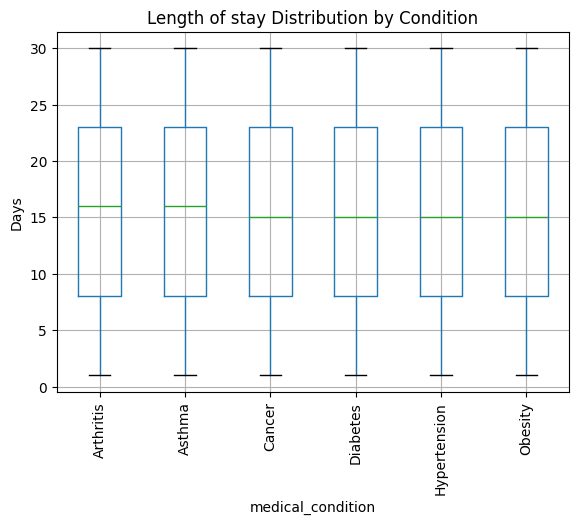

In [72]:
#Plot representation
plt.Figure(figsize=(12,6))
hospital.boxplot(column='length_of_stay', by='medical_condition', rot=90)
plt.title("Length of stay Distribution by Condition")
plt.suptitle("")
plt.ylabel("Days")
plt.show()

In [73]:
#Count of admissions per doctor to figure out which doctor has more patient intake
doctor_load = hospital.pivot_table(
    index='doctor_name',
    values='admission_id',
    aggfunc='count'
).sort_values('admission_id', ascending=False)

doctor_load.head(10)

,admission_id
doctor_name,
Michael Smith,24
John Smith,21
Robert Smith,19
Michael Johnson,19
David Smith,18
Robert Johnson,17
James Smith,17
Michael Williams,17
Matthew Smith,16


From the table above it shows that Dr Michael smith has more booked admissions than any other doctor, seconded by John Smith..

In [74]:
#monthly patient admissions
hospital['admit_month'] = hospital['date_of_admission'].dt.strftime('%b %Y')

monthly_trend = hospital.pivot_table(
    index='admit_month',
    values='admission_id',
    aggfunc='count'
).sort_values('admission_id', ascending=False)

monthly_trend.head(20)

,admission_id
admit_month,
Aug 2020,912
Oct 2019,905
Jul 2020,901
Aug 2019,899
Jul 2021,885
Jan 2022,880
Jun 2022,879
Dec 2022,878
May 2020,878


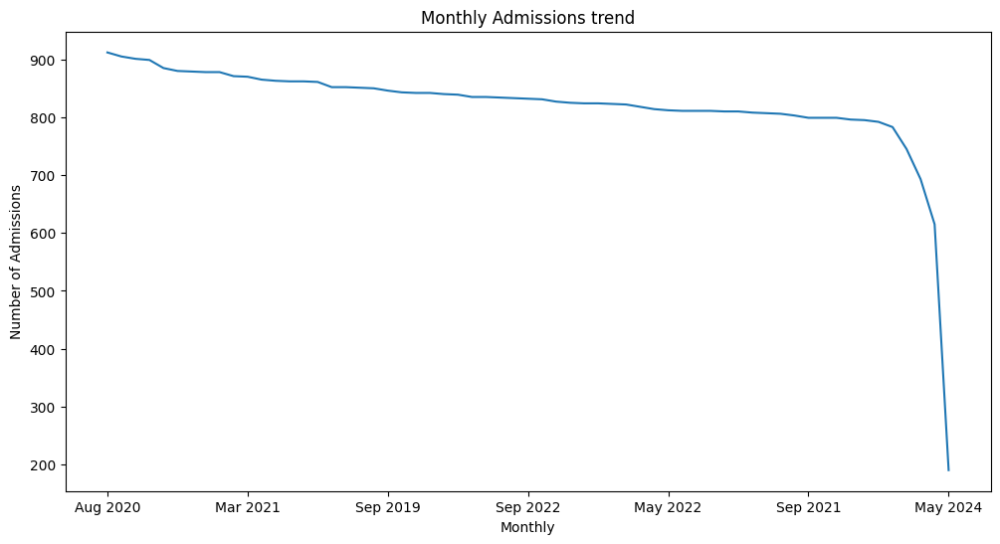

In [75]:
monthly_trend.plot(kind='line', figsize=(12,6), legend=False)
plt.title('Monthly Admissions trend')
plt.xlabel("Monthly")
plt.ylabel("Number of Admissions")
plt.show()

From the table above and the plots too, it shows that further dive into the admissions trend needs a much futher dive to understand the trend by year and not just month, seeing that we have a 3+ year range.

In [76]:
#admission trend by year
hospital['admit_year'] = hospital['date_of_admission'].dt.year

#table
yearly_trend = hospital.pivot_table(
    index='admit_year',
    values='admission_id',
    aggfunc='count'
).sort_values('admission_id', ascending=False)

yearly_trend.head(10)

,admission_id
admit_year,
2020,10156
2022,9936
2023,9929
2021,9883
2019,6635
2024,3461


In [77]:
hospital.head(20)

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,insurance_provider,billing_amount,room_number,...,discharge_date,medication,test_results,patient_id,doctor_id,admission_id,length_of_stay,age_group,admit_month,admit_year
1,a0231bce223a2e6b89f01f59065c6ed957727fce4a5488...,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Blue Cross,18856.28,328,...,2024-02-02,Paracetamol,Normal,P00001,D0001,A000001,2,18-35,Jan 2024,2024
2,fbb40dacf3800d2e506688ba4c82d25722192af93efab9...,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Medicare,33643.33,265,...,2019-08-26,Ibuprofen,Inconclusive,P00002,D0002,A000002,6,56-75,Aug 2019,2019
3,080084b4f4c28779a2ffa9b26f3976dc9fa27a206571bf...,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Aetna,27955.10,205,...,2022-10-07,Aspirin,Normal,P00003,D0003,A000003,15,76+,Sep 2022,2022
4,c9a8105495897e9fe9dba497f4af8d79aa541924a452b0...,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,Medicare,37909.78,450,...,2020-12-18,Ibuprofen,Abnormal,P00004,D0004,A000004,30,18-35,Nov 2020,2020
5,70fa69e847cc6d13982eea2fe070207b527d1a0f374954...,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,Aetna,14238.32,458,...,2022-10-09,Penicillin,Abnormal,P00005,D0005,A000005,20,36-55,Sep 2022,2022
6,b115caa96e33efbc14194d372a96a78d5fdfa56d81a84c...,36,Male,A+,Asthma,2023-12-20,Taylor Newton,UnitedHealthcare,48145.11,389,...,2023-12-24,Ibuprofen,Normal,P00006,D0006,A000006,4,36-55,Dec 2023,2023
7,6dcc46f6e8c8eff1669e3274940fb988a43fc71a4841e9...,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Medicare,19580.87,389,...,2020-11-15,Paracetamol,Inconclusive,P00007,D0007,A000007,12,18-35,Nov 2020,2020
8,445af428e4699978dd61ce838526c3b54ac0bb3ffc9766...,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,Cigna,45820.46,277,...,2022-01-07,Paracetamol,Inconclusive,P00008,D0008,A000008,10,18-35,Dec 2021,2021
9,d239d494121fb5fb1534ec924e73bdd1435d8c297af0ed...,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Cigna,50119.22,316,...,2020-07-14,Aspirin,Abnormal,P00009,D0009,A000009,13,76+,Jul 2020,2020
10,e7e018e2c12cbfdfa8cc9119164c2abfbd163b2592f9da...,58,Female,AB-,Cancer,2021-05-23,Heather Day,UnitedHealthcare,19784.63,249,...,2021-06-22,Paracetamol,Inconclusive,P00010,D0010,A000010,30,56-75,May 2021,2021


In [78]:
hospital.columns

Index(['patient_name', 'age', 'gender', 'blood_type', 'medical_condition',
       'date_of_admission', 'doctor_name', 'insurance_provider',
       'billing_amount', 'room_number', 'admission_type', 'discharge_date',
       'medication', 'test_results', 'patient_id', 'doctor_id', 'admission_id',
       'length_of_stay', 'age_group', 'admit_month', 'admit_year'],
      dtype='object')

In [79]:
#admission day of the week
hospital['admit_day_week'] = hospital['date_of_admission'].dt.day_name()

In [80]:
#discharge day of the week 
hospital['discharge_day_week'] = hospital['discharge_date'].dt.day_name()

In [81]:
hospital.head(20)

,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,insurance_provider,billing_amount,room_number,...,test_results,patient_id,doctor_id,admission_id,length_of_stay,age_group,admit_month,admit_year,admit_day_week,discharge_day_week
1,a0231bce223a2e6b89f01f59065c6ed957727fce4a5488...,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Blue Cross,18856.28,328,...,Normal,P00001,D0001,A000001,2,18-35,Jan 2024,2024,Wednesday,Friday
2,fbb40dacf3800d2e506688ba4c82d25722192af93efab9...,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Medicare,33643.33,265,...,Inconclusive,P00002,D0002,A000002,6,56-75,Aug 2019,2019,Tuesday,Monday
3,080084b4f4c28779a2ffa9b26f3976dc9fa27a206571bf...,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Aetna,27955.10,205,...,Normal,P00003,D0003,A000003,15,76+,Sep 2022,2022,Thursday,Friday
4,c9a8105495897e9fe9dba497f4af8d79aa541924a452b0...,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,Medicare,37909.78,450,...,Abnormal,P00004,D0004,A000004,30,18-35,Nov 2020,2020,Wednesday,Friday
5,70fa69e847cc6d13982eea2fe070207b527d1a0f374954...,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,Aetna,14238.32,458,...,Abnormal,P00005,D0005,A000005,20,36-55,Sep 2022,2022,Monday,Sunday
6,b115caa96e33efbc14194d372a96a78d5fdfa56d81a84c...,36,Male,A+,Asthma,2023-12-20,Taylor Newton,UnitedHealthcare,48145.11,389,...,Normal,P00006,D0006,A000006,4,36-55,Dec 2023,2023,Wednesday,Sunday
7,6dcc46f6e8c8eff1669e3274940fb988a43fc71a4841e9...,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Medicare,19580.87,389,...,Inconclusive,P00007,D0007,A000007,12,18-35,Nov 2020,2020,Tuesday,Sunday
8,445af428e4699978dd61ce838526c3b54ac0bb3ffc9766...,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,Cigna,45820.46,277,...,Inconclusive,P00008,D0008,A000008,10,18-35,Dec 2021,2021,Tuesday,Friday
9,d239d494121fb5fb1534ec924e73bdd1435d8c297af0ed...,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Cigna,50119.22,316,...,Abnormal,P00009,D0009,A000009,13,76+,Jul 2020,2020,Wednesday,Tuesday
10,e7e018e2c12cbfdfa8cc9119164c2abfbd163b2592f9da...,58,Female,AB-,Cancer,2021-05-23,Heather Day,UnitedHealthcare,19784.63,249,...,Inconclusive,P00010,D0010,A000010,30,56-75,May 2021,2021,Sunday,Tuesday


In [83]:
id_profile = ['gender', 'blood_type', 'age_group', 'age']

conflicts = (
    hospital.groupby('patient_id')[id_profile]
    .nunique()                
    .max(axis=1)               
)

bad_ids = conflicts[conflicts > 1].index.tolist()
print("Problem patient_ids:", len(bad_ids))


Problem patient_ids: 1010


In [84]:
hospital[hospital['patient_id'].isin(bad_ids)]\
    .sort_values(['patient_id','date_of_admission'])\
    .head(50)


,patient_name,age,gender,blood_type,medical_condition,date_of_admission,doctor_name,insurance_provider,billing_amount,room_number,...,test_results,patient_id,doctor_id,admission_id,length_of_stay,age_group,admit_month,admit_year,admit_day_week,discharge_day_week
58,f97c884d1a172ea9ab3b08a1ed48231f591a022bad12cf...,23,Male,O-,Hypertension,2022-09-21,Mrs. Lori Hurst PhD,Aetna,37951.66,405,...,Inconclusive,P00058,D0058,A000058,4,18-35,Sep 2022,2022,Wednesday,Sunday
32355,f97c884d1a172ea9ab3b08a1ed48231f591a022bad12cf...,63,Male,O-,Cancer,2023-06-30,Ronald Gordon,Medicare,47418.00,387,...,Inconclusive,P00058,D27679,A032355,6,56-75,Jun 2023,2023,Friday,Thursday
16081,05f99c0104c4922c2e6e444d1c36231e8763cd32c9221d...,34,Male,B+,Obesity,2019-09-26,Charles Nguyen,Aetna,22013.75,129,...,Inconclusive,P00069,D14701,A016081,1,18-35,Sep 2019,2019,Thursday,Friday
16420,05f99c0104c4922c2e6e444d1c36231e8763cd32c9221d...,71,Male,B+,Arthritis,2021-09-06,Kathryn Hicks,Blue Cross,48954.64,434,...,Abnormal,P00069,D14991,A016420,20,56-75,Sep 2021,2021,Monday,Sunday
69,05f99c0104c4922c2e6e444d1c36231e8763cd32c9221d...,31,Male,B+,Diabetes,2024-02-06,Jonathan Drake,UnitedHealthcare,35776.82,489,...,Normal,P00069,D0069,A000069,4,18-35,Feb 2024,2024,Tuesday,Saturday
104,6d0a2fe09929ac7402380d53d777e289f545ac814ea851...,47,Male,A-,Diabetes,2019-07-09,Patricia Colon,Medicare,31516.10,418,...,Inconclusive,P00104,D0104,A000104,27,36-55,Jul 2019,2019,Tuesday,Monday
3548,6d0a2fe09929ac7402380d53d777e289f545ac814ea851...,70,Male,A-,Diabetes,2021-01-01,Nicholas Vaughn,Blue Cross,22673.15,390,...,Normal,P00104,D3462,A003548,26,56-75,Jan 2021,2021,Friday,Wednesday
6942,44ef35e3afeda437723e70b95ef6da0559b7d948c4381b...,59,Female,A+,Asthma,2021-05-24,Maxwell Rogers,Aetna,19957.70,112,...,Inconclusive,P00119,D6642,A006942,4,56-75,May 2021,2021,Monday,Friday
119,44ef35e3afeda437723e70b95ef6da0559b7d948c4381b...,83,Female,A+,Diabetes,2024-01-13,Michael Baker,Blue Cross,10352.21,394,...,Abnormal,P00119,D0119,A000119,9,76+,Jan 2024,2024,Saturday,Monday
33253,9721be481d685f8f228812b010612e808b771ae7f1fd37...,23,Female,A+,Arthritis,2019-09-05,Alexander Baker,Blue Cross,33177.72,472,...,Inconclusive,P00159,D28354,A033253,2,18-35,Sep 2019,2019,Thursday,Saturday


In [86]:
key_cols = ['gender','blood_type','age_group','age']

# Create a fingerprint string for each row
hospital['profile_key'] = hospital[key_cols].astype(str).agg('|'.join, axis=1)

# Rank distinct profiles within each patient_id
hospital['profile_grp'] = (
    hospital.groupby('patient_id')['profile_key']
    .transform(lambda s: s.rank(method='dense').astype(int))
)

# Apply suffix for conflicting IDs
mask_conflicted = hospital['patient_id'].isin(bad_ids)
suffix_map = {1:'A', 2:'B', 3:'C', 4:'D', 5:'E'}

hospital.loc[mask_conflicted, 'patient_id'] = (
    hospital.loc[mask_conflicted, 'patient_id'] +
    hospital.loc[mask_conflicted, 'profile_grp'].map(suffix_map).fillna('X')
)

# Clean up temp columns
hospital.drop(columns=['profile_key','profile_grp'], inplace=True)


In [87]:
conflicts_after = (
    hospital.groupby('patient_id')[id_profile].nunique().max(axis=1)
)
print("Remaining conflicted patient_ids:", (conflicts_after > 1).sum())


Remaining conflicted patient_ids: 0


In [88]:
#Download the cleaned data (70% cleaned) 
def create_download_link(hospital, filename="hospital.csv"):
    csv = hospital.to_csv(index=False)
    b64 = base64.b64encode(csv.encode()).decode()
    return HTML(f'<a download="{filename}" href="data:text/csv;base64,{b64}">Download CSV</a>')

create_download_link(hospital)